# 안녕하세요:)

## '서울시 생활정보 기반 대중교통 수요 분석 ' 과정에 오신 여러분을 환영합니다.
* 본 과정에서는 서울시 생활정보 데이터를 기반으로 데이터 분석을 시도하고 주어진 문제를 해결할 것입니다.


* 우리는 공공 데이터를 활용해 버스노선 관련 인사이트를 도출하여 유용한 정책을 세우는데 도움을 주고자 합니다

## ▣ 우리가 풀어야 하는 문제는 무엇인가요?

* 제공 데이터
    - 구 별 유동인구 데이터
    - 구 별 주민 등록 데이터
    - 구 별 업종 등록 정보
    - 버스 승하차 및 운행 노선 데이터 

### 위 제공 데이터를 분석하여 버스 노선 추가 필요 대상 지역(구 단위)을 선정합니다

# 이 4개의 데이터들을 어떻게 합칠까요?

In [1]:
import pandas as pd
import numpy as np

In [6]:
df_seoul_bus_station = pd.read_csv('df_seoul_bus_station.csv', sep=",", encoding = 'UTF-8')
df_seoul_moving = pd.read_csv('df_seoul_moving.csv', sep=",", encoding = 'UTF-8')
df_seoul_moving_custom = pd.read_csv('df_seoul_moving_custom.csv', sep=",", encoding = 'UTF-8')
df_seoul_business = pd.read_csv('df_seoul_business.csv', sep=",", encoding = 'UTF-8')
df_seoul_people = pd.read_csv('df_seoul_people.csv', sep=",", encoding = 'UTF-8')
df_custom = pd.read_csv('df_custom.csv', sep=",", encoding = 'UTF-8')

In [7]:
df = pd.merge(df_seoul_bus_station,df_seoul_people,how='inner', on='자치구')
df = pd.merge(df,df_seoul_business,how='inner', on='자치구')
df = pd.merge(df,df_seoul_moving_custom,how='inner', on='자치구')
df = pd.merge(df,df_custom,how='inner', on='자치구')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26 entries, 0 to 25
Data columns (total 61 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   자치구                 26 non-null     object 
 1   정류장수                26 non-null     int64  
 2   노선수                 26 non-null     int64  
 3   승차총승객수              26 non-null     int64  
 4   하차총승객수              26 non-null     int64  
 5   승차평균승객수             26 non-null     float64
 6   하차평균승객수             26 non-null     float64
 7   정류장과 노선의 비율         26 non-null     float64
 8   정류장 필요 수치(승차)       26 non-null     float64
 9   정류장 필요 수치(하차)       26 non-null     float64
 10  기간                  26 non-null     object 
 11  세대                  26 non-null     int64  
 12  인구                  26 non-null     int64  
 13  남자                  26 non-null     int64  
 14  여자                  26 non-null     int64  
 15  한국인                 26 non-null     int64  
 16  한국인 남자    

In [ ]:
df.info()

In [8]:
# 아래에 실습코드를 작성하고 결과를 확인합니다.
df.head()

,자치구,정류장수,노선수,승차총승객수,하차총승객수,승차평균승객수,하차평균승객수,정류장과 노선의 비율,정류장 필요 수치(승차),정류장 필요 수치(하차),...,총 이동인구,이동인구의 평균나이,전체 평균 이동 시간(분),유출 이동인구,유출 이동인구의 평균나이,유출 평균 이동 시간(분),유입 이동인구,유입 이동인구의 평균나이,유입 평균 이동 시간(분),유입 유출 차이
0,합계,10615,1823,122800932,120017515,11568.622892,11306.407442,0.171738,1986.773390,1941.741005,...,4.871121e+08,42.209285,23.000996,2.317285e+08,43.170441,24.144719,2.317285e+08,43.228519,24.138212,9.778887e-09
1,강남구,499,91,8030483,7569213,128.767927,121.371512,0.182365,23.482728,22.133883,...,4.415962e+07,39.820722,23.171688,2.044440e+07,41.450300,24.071387,2.096943e+07,41.270218,24.001766,5.250279e+05
2,강동구,369,21,2890053,2830506,99.161194,97.118065,0.056911,5.643320,5.527044,...,2.127952e+07,42.824827,25.082530,6.848911e+06,44.625213,26.624595,6.670855e+06,44.817706,27.278037,-1.780555e+05
3,강북구,413,67,4825181,4671783,133.020373,128.791504,0.162228,21.579576,20.893537,...,1.262629e+07,45.628012,23.630666,6.303505e+06,45.499183,24.995846,6.247631e+06,45.617155,25.175052,-5.587416e+04
4,강서구,566,49,4681083,4652828,88.119480,87.587591,0.086572,7.628718,7.582671,...,2.172704e+07,41.797724,25.444131,7.931455e+06,42.926706,26.891138,8.044174e+06,43.027388,26.478968,1.127189e+05


### 외곽=1, 외각아닌 곳=0

In [9]:
df['외곽 여부'] = (np.nan,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1)

In [28]:
df.head()

,자치구,정류장수,노선수,승차총승객수,하차총승객수,승차평균승객수,하차평균승객수,정류장과 노선의 비율,정류장 필요 수치(승차),정류장 필요 수치(하차),...,이동인구의 평균나이,전체 평균 이동 시간(분),유출 이동인구,유출 이동인구의 평균나이,유출 평균 이동 시간(분),유입 이동인구,유입 이동인구의 평균나이,유입 평균 이동 시간(분),유입 유출 차이,외곽 여부
0,합계,10615,1823,122800932,120017515,11568.622892,11306.407442,0.171738,1986.773390,1941.741005,...,42.209285,23.000996,2.317285e+08,43.170441,24.144719,2.317285e+08,43.228519,24.138212,9.778887e-09,NaN
1,강남구,499,91,8030483,7569213,128.767927,121.371512,0.182365,23.482728,22.133883,...,39.820722,23.171688,2.044440e+07,41.450300,24.071387,2.096943e+07,41.270218,24.001766,5.250279e+05,1.0
2,강동구,369,21,2890053,2830506,99.161194,97.118065,0.056911,5.643320,5.527044,...,42.824827,25.082530,6.848911e+06,44.625213,26.624595,6.670855e+06,44.817706,27.278037,-1.780555e+05,1.0
3,강북구,413,67,4825181,4671783,133.020373,128.791504,0.162228,21.579576,20.893537,...,45.628012,23.630666,6.303505e+06,45.499183,24.995846,6.247631e+06,45.617155,25.175052,-5.587416e+04,1.0
4,강서구,566,49,4681083,4652828,88.119480,87.587591,0.086572,7.628718,7.582671,...,41.797724,25.444131,7.931455e+06,42.926706,26.891138,8.044174e+06,43.027388,26.478968,1.127189e+05,1.0
5,관악구,466,86,7655819,7792476,154.753674,157.516040,0.184549,28.559691,29.069484,...,41.243225,23.182141,8.925137e+06,41.833313,24.319555,8.744972e+06,42.102415,24.528613,-1.801658e+05,1.0
6,광진구,269,41,2749448,2753411,118.352546,118.523137,0.152416,18.038864,18.064865,...,40.319899,22.161860,8.134327e+06,41.413116,23.217616,8.177809e+06,41.334807,23.556888,4.348149e+04,1.0
7,구로구,486,79,4942197,4730992,119.235615,114.140076,0.162551,19.381921,18.553634,...,43.505280,23.186041,7.108515e+06,43.811186,24.433002,7.023787e+06,43.916067,24.152147,-8.472816e+04,1.0
8,금천구,345,58,3776658,3581930,123.098370,116.751304,0.168116,20.694798,19.627755,...,43.035171,23.925275,4.015105e+06,43.112894,25.574075,3.970004e+06,43.332631,25.683841,-4.510173e+04,1.0
9,노원구,514,57,4353295,4292724,88.476211,87.245168,0.110895,9.811564,9.675048,...,42.773755,24.287890,8.131796e+06,44.412484,25.581497,7.993732e+06,44.481268,25.280241,-1.380643e+05,1.0


---

## 1.가설 수립 
+ 어떤 데이터를 label 데이터로 하실 건가요?

? 정해진게 없나요? - 네 라벨을 개인및 조별로 고민하셔서 라벨데이터를 설정하시면 되겠습니다
? 가설마다 라벨데이터가 달라도 상관없나요? 네 그렇습니다
? 가설은 3개만 해야하나요? 그 이상 하셔도 무방합니다

### 가설을 설정해 봅시다 (인당 최소 3개) - 미니프로젝트 진행의 편의상 가설은 이변량 분석을 염두에 두고 설정해 주세요

* 가설 1

* 가설 2

* 가설 3

## 2.단변량 분석

+ 변수의 비즈니스 의미  

+ 숫자? 범주?  

+ 전처리 사항
   - NaN 존재 여부 및 조치 방안  
   - 가변수화 대상여부  
   
+ 기초통계량

+ 분포  

+ 위 정보로부터 파악한 내용(비즈니스!) 정리  

+ 추가 분석해볼 사항 도출

In [15]:
# 시각화 한글폰트 설정
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set(font="Malgun Gothic",#"NanumGothicCoding", 
        rc={"axes.unicode_minus":False}, # 마이너스 부호 깨짐 현상 해결
        style='darkgrid')    

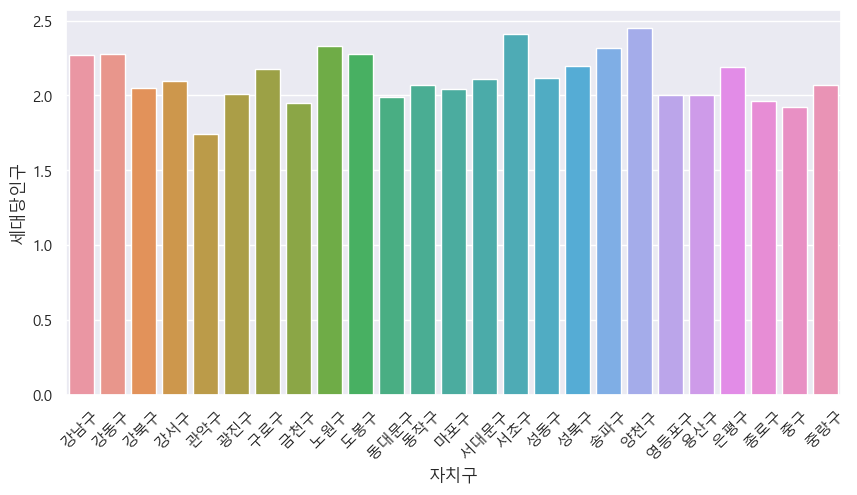

In [16]:
corr = df.loc[1:,].corr()
plt.figure(figsize=(40,35))
sns.heatmap(corr, annot=True, fmt='.1f')
plt.show

### 1)


### 2)

### 3)

## 3.이변량 분석

* 자료의 종류에 맞게 X --> Y 에 대해서 그래프(시각화)와 가설검정(수치화)를 수행하고 결과를 평가합니다.

* 가설검정시 다음의 항목을 참조하여 수행합니다.
    * 유의수준 : 5%
    * 숫자 --> 숫자 : 상관분석
    * 범주 --> 범주 : 카이제곱검정
    * 범주 --> 숫자 : t검정, 분산분석
    * 숫자 --> 범주 : 로지스틱 회귀모형을 통해, 회귀계수의 P.value로 검정을 수행합니다.


In [19]:
#target = 

### 1)

### 2)

### 3)

### 상관계수를 구하고 HeatMap으로 시각화 후 나름의 분석을 해보세요.



In [20]:
# 아래에 실습코드를 작성하고 상관계수를 확인 및 시각화 합니다.
import scipy.stats as spst

#spst.pearsonr(X,Y)

C:\Users\wldud\AppData\Local\Temp\ipykernel_2276\814944190.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.loc[1:,].corr()


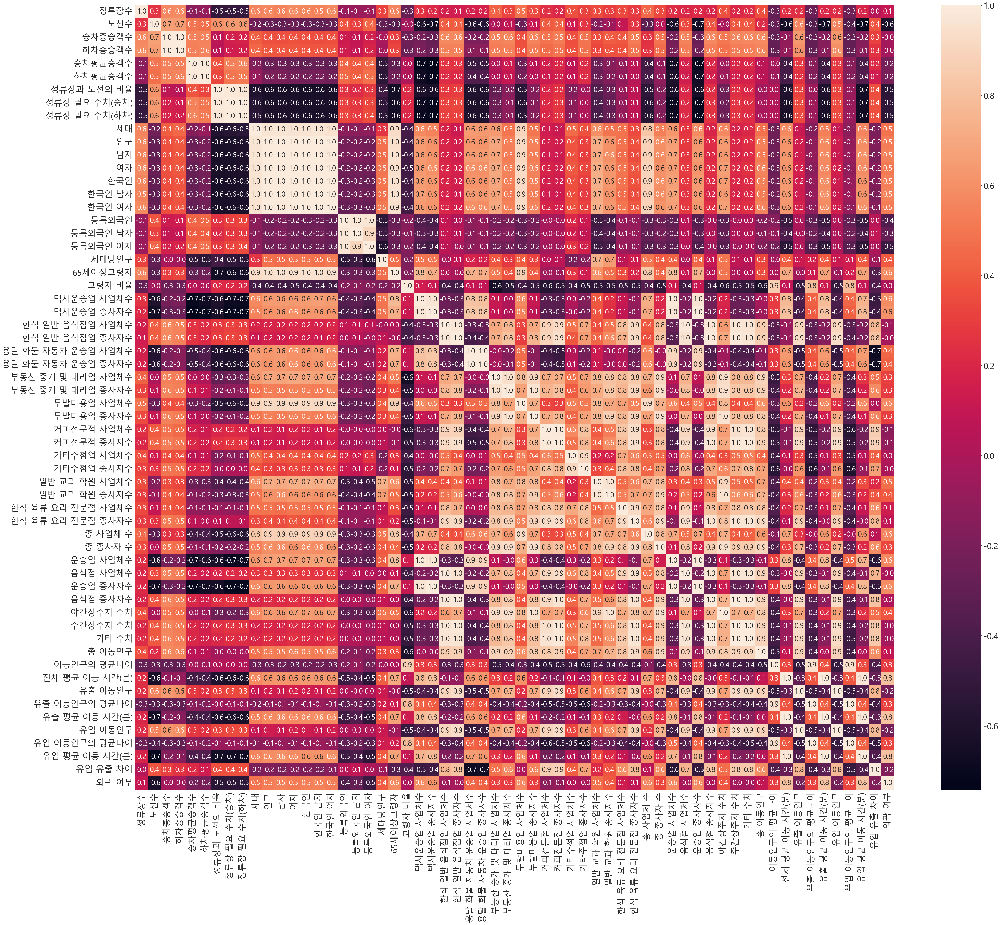

In [22]:
df_without_sum = df.drop(index=0)
spst.pearsonr(df_without_sum ['외곽 여부'],df_without_sum ['노선수'])

PearsonRResult(statistic=-0.6153362320640474, pvalue=0.001060699317524454)

In [23]:
spst.pearsonr(df_without_sum ['유출 평균 이동 시간(분)'],df_without_sum ['외곽 여부'])

PearsonRResult(statistic=0.811726687344557, pvalue=8.442713064067198e-07)

In [24]:
spst.pearsonr(df_without_sum ['유입 평균 이동 시간(분)'],df_without_sum ['외곽 여부'])

PearsonRResult(statistic=0.8112295816675097, pvalue=8.67995368614889e-07)

In [25]:
sns.pairplot(df)

In [26]:
# 위 차트를 통해 알게된 사실을 정리해봅시다.
# 1. 
# 2.
# 3.

## 4.관계 정리

### 1) 강한 관계의 변수

### 2) 약한 관계의 변수

## 5.솔루션 도출

### 어느 구에 버스 노선 또는 정류장이 제일 필요한가요? 그 이유는?